**Run the code chunk below to load all the images and script**

In [0]:
!git clone https://github.com/hellozeyu/YOLOv3-webinar.git
!cp -r YOLOv3-webinar/img /usr/local/share/jupyter/nbextensions/
!cp YOLOv3-webinar/helpers.py .

Cloning into 'YOLOv3-webinar'...
remote: Enumerating objects: 33, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 33 (delta 2), reused 30 (delta 2), pack-reused 0
Unpacking objects: 100% (33/33), done.


## Introduction to Computer Vision

#### Image Classification
- Typically, image classification is used in applications where there is only one object in the image. There could be multiple classes (e.g. cats, dogs, etc.) but usually, there is only one instance of that class in the image.
- The current state-of-the-art (SOTA) model already outperformed human being on the [ImageNet Competition](http://www.image-net.org/challenges/LSVRC/).
- Convolutional Neural Network (CNN) is by far the best solution. Most of the SOTA models are using CNN.
- People found out that the behaviors of filters in the convolutional layers are generic (edge detectors or color blob detectors), people would reuse the weights of base convolutional layers trained on ImageNet and fine-tune the top layers for a new project.

In [0]:
%%html
<center><b><i>Photo credits to my dear colleagues Thomas and Terence</i></b></center>
<img src="/nbextensions/img/cat.jpg" alt="img" width="500" height="450" align="left"/>
<img src="/nbextensions/img/dog.jpg" alt="img" width="500" height="450" align="right"/>

#### Object Detection
- In most applications where there are more than one objects in the input image, we need to find the location of the objects, and then classify them. We use an object detection algorithm in such cases.
- Object detection can be hundreds of times slower than image classification because you need to predict the **contour** and the class at the same time. We can think of object detection as a two-step process:
 - Find bounding boxes containing objects such that each bounding box has only one object.
 - Classify the image inside each bounding box and assign it a label.

In [0]:
%%html
<img src="/nbextensions/img/cat1.png" alt="img" width="500" height="450" align="left"/>
<img src="/nbextensions/img/dog1.jpg" alt="img" width="500" height="450" align="right"/>

#### Applications of Object Detection

In [0]:
%%html
<i>Self Driving Car</i>
<br></br>
<img src="/nbextensions/img/person.png" alt="img" width="500" height="400"/>

In [0]:
%%html
<i>Store Sales</i>
<br></br>
<img src="/nbextensions/img/store.png" alt="img" width="500" height="400"/>

## How do we find the regions?

**Region Proposal Algorithms** - Selective Search
- Selective search takes an image as the input and output bounding boxes corresponding to all patches in an image that are most likely to contain objects. 
- These region proposals can be noisy (high recall, low precision), overlapping and may not contain the object perfectly but amongst these region proposals, there will be a proposal which will be very close to the actual object in the image. 
- Selective Search starts by over-segmenting the image based on intensity of the pixels using a [graph-based segmentation method](http://cs.brown.edu/people/pfelzens/segment/) by Felzenszwalb and Huttenlocher. The output of the algorithm is shown below. The image on the right contains segmented regions represented using solid colors.

In [0]:
%%html
<center><i>Regional Proposal Algorithm</i></center>
<img src="/nbextensions/img/breakfast.jpg" alt="img" width="500" height="450" align="left"/>
<img src="/nbextensions/img/breakfast_fnh.jpg" alt="img" width="500" height="450" align="right"/>

- Selective Search algorithm takes these oversegments as initial input and performs the following steps:
1. Add all bounding boxes corresponding to segmented parts to the list of regional proposals
2. Group adjacent segments based on similarity
3. Go to step 1
- At each iteration, larger segments are formed and added to the list of region proposals. Hence we create region proposals from smaller segments to larger segments in a bottom-up approach. This is what we mean by computing “hierarchical” segmentations using Felzenszwalb and Huttenlocher’s oversegments.

In [0]:
%%html
<img src="/nbextensions/img/hierarchical-segmentation-1.jpg" alt="img" width="700" height="400"/>

Total Number of Region Proposals: 2306


Text(0.5, 1.0, 'Selective Search Output')

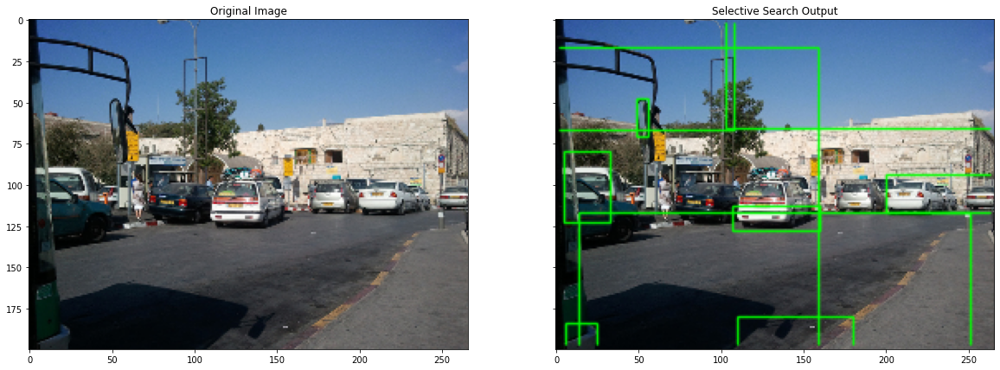

In [0]:
import cv2
from matplotlib import pyplot as plt
%matplotlib inline

# speed-up using multithreads
cv2.setUseOptimized(True);
cv2.setNumThreads(4);

# read image
im = cv2.imread('YOLOv3-webinar/img/car.jpg')
# resize image
newHeight = 200
newWidth = int(im.shape[1]*200/im.shape[0])
im = cv2.resize(im, (newWidth, newHeight))    

# create Selective Search Segmentation Object using default parameters
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

# set input image on which we will run segmentation
ss.setBaseImage(im)

# Switch to high recall but slow Selective Search method
ss.switchToSelectiveSearchQuality()

# Switch to fast but low recall Selective Search method
# ss.switchToSelectiveSearchFast()

# run selective search segmentation on input image
rects = ss.process()
print('Total Number of Region Proposals: {}'.format(len(rects)))

# number of region proposals to show
numShowRects = 10

# create a copy of original image
imOut = im.copy()

# itereate over all the region proposals
for i, rect in enumerate(rects):
    # draw rectangle for region proposal till numShowRects
    if (i < numShowRects):
        x, y, w, h = rect
        cv2.rectangle(imOut, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
    else:
        break

im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)      
imOut = cv2.cvtColor(imOut, cv2.COLOR_BGR2RGB) 

#Show the image with matplotlib
f, axarr = plt.subplots(1, 2, figsize=(20, 10), sharey=True)
axarr[0].imshow(im)
axarr[0].set_title('Original Image')
axarr[1].imshow(imOut)
axarr[1].set_title('Selective Search Output')

## R-CNN
- Convolutional Neural Network (CNN) based image classifiers became popular after a CNN based method won the ImageNet Large Scale Visual Recognition Challenge (ILSVRC) in 2012. Because every object detector has an image classifier at its heart, the invention of a CNN based object detector became inevitable.
- One of the first approaches that used region proposals was called R-CNN (Regional CNN) by [Ross Girshick et al](https://arxiv.org/pdf/1311.2524.pdf).
- They used Selective Search to detect 2000 region proposals and ran a CNN + SVM based image classifier on these 2000 bounding boxes.
- The accuracy of R-CNN at that time was the state of the art, but the speed was still very slow ( 18-20 seconds per image on a GPU )

In [0]:
%%html
<img src="/nbextensions/img/rcnn.png" alt="img" width="500" height="400" />

## Fast R-CNN Object Detector

- In R-CNN each bounding box was independently classified by the image classifier. There were 2000 region proposals and the image classifier calculated a feature map for each region proposal. This process was expensive.

- In the followup work by Ross Girshick, he proposed a method called [Fast R-CNN](https://arxiv.org/pdf/1504.08083.pdf) that significantly sped up object detection.

- The idea was to calculate a single feature map for the entire image instead of 2000 feature maps for 2000 region proposals. For each region proposal, a region of interest (RoI) pooling layer extracted a fixed-length feature vector from the feature map. Each feature vector was then used to for two purposes
 - Classify the region into one of the classes ( e.g. dog, cat, background ).
 - Improve the accuracy of the original bounding box using a bounding box regressor.
- Convolutional operation is now only done once per image to create a feature map

In [0]:
%%html
<img src="/nbextensions/img/frcnn.png" alt="img" width="900" height="400" />

- One challenging problem of Fast R-CNN is that different region proposals will have different size after they pass through the CNN.
That means when you flatten it, they will be of different sizes. Then it will become a problem when it goes through the fully connected layers, which requires fixed size of input.
That's when RoI pooling layer comes in handy!

![img](https://i.stack.imgur.com/rJL7D.gif)

[Image Source](https://deepsense.ai/region-of-interest-pooling-explained/)

## Faster R-CNN Object Detector
- In Fast R-CNN, even though the computation for classifying 2000 region proposals was shared, the part of the algorithm that generated region proposals did not share any computation with the part that performed image classification.

- In the followup work called [Faster R-CNN](https://arxiv.org/pdf/1506.01497.pdf), the main insight was that the two parts, calculating region proposals and image classification, could use the same feature map and therefore share the computational load.

- A Convolutional Neural Network was used to produce a feature map of the image which was simultaneously used for training a region proposal network and an image classifier. Because of this shared computation, there was a significant improvement in the speed of object detection.

In [0]:
%%html
<img src="/nbextensions/img/frrcnn.png" alt="img" width="600" height="700" />

### Anchors

- Now the issue is how do we train the neural network to learn where the bounding box is. The challenge part is that objects could be of variable length or shape.

- The variable-length problem is solved in the Region Proposal Network (RPN) by using anchors: **fixed sized reference bounding boxes which are placed uniformly throughout the original image.** 
- Instead of having to detect where objects are, we model the problem into two parts. For every anchor, we ask:
 - Does this anchor contain a relevant object?
 - How would we adjust this anchor to better fit the relevant object?

- It turns out that there is a simple approach to predicting bounding boxes by learning to predict offsets from reference boxes. We take a reference box $x_{center}$, $y_{center}$, $width$, $height$ and learn to predict $\Delta_{x_{center}}$, $\Delta_{y_{center}}$, $\Delta_{width}$, $\Delta_{height}$ , which are usually small values that tweak the reference box to better fit what we want.

- Since we only have convolutional and pooling layers, the dimensions of the feature map will be proportional to those of the original image. Mathematically, if the image was $w \times h$, the feature map will end up $w/r \times h/r$ where $r$ is called subsampling ratio. If we define one anchor per spatial position of the feature map, the final image will end up with a bunch of anchors separated by $r$ pixels. In the case of VGG, $r = 16$.

In [0]:
%%html
<img src="/nbextensions/img/anchors1.png" alt="img" width="500" height="400" />

- In order to choose the set of anchors we usually define a set of sizes (e.g. 64px, 128px, 256px) and a set of ratios between width and height of boxes (e.g. 0.5, 1, 1.5) and use all the possible combinations of sizes and ratios.

In [0]:
%%html
<center><i>Left: Anchors, Center: Anchor for a single point, Right: All anchors</i></center>
<img src="/nbextensions/img/anchors2.png" alt="img" width="1100" height="400" />

## YOLO (You Only Look Once) Object Detector

- Even with Region Proposal Network (RPN), we still need to generate those region proposals. **Why don't we define the grid ahead of time?**
- As an object detection algorithm, what makes YOLO different from Faster RCNN?

In [0]:
%%html
<img src="/nbextensions/img/yolov3-1.png" alt="img" width="600" height="400" />

- YOLOv3 makes prediction across 3 different scales. The detection layer is used to make detection at feature maps of three different sizes, having strides **32, 16, 8** respectively. This means, with an input of 416 x 416, we make detections on scales 13 x 13, 26 x 26 and 52 x 52.
- The network downsamples the input image until the first detection layer, where a detection is made using feature maps of a layer with stride 32. Further, layers are upsampled by a factor of 2 and concatenated with feature maps of a previous layers having identical feature map sizes. Another detection is now made at layer with stride 16. The same upsampling procedure is repeated, and a final detection is made at the layer of stride 8.

In [0]:
%%html
<img src="/nbextensions/img/yolo_v3_architecture.png" alt="img" width="800" height="500" />

- At each scale, each cell predicts 3 bounding boxes using 3 anchors, making the total number of anchors used 9. (The anchors are different for different scales)
- The authors report that this helps YOLO v3 get better at detecting small objects, a frequent complaint with the earlier versions of YOLO. Upsampling can help the network learn fine-grained features which are instrumental for detecting small objects.

In [0]:
%%html
<img src="/nbextensions/img/yolov3.png" alt="img" width="450" height="600" align="left"/>
<img src="/nbextensions/img/yolov3-2.png" alt="img" width="400" height="600" align="right"/>

## Let's build the YOLOv3 model together!

#### Download the pre-trained weights from the [COCO competition](http://cocodataset.org/#home)

In [0]:
!wget https://pjreddie.com/media/files/yolov3.weights

--2020-05-20 02:25:03--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M   307KB/s    in 20m 18s 

2020-05-20 02:45:23 (199 KB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [0]:
from keras.layers import Conv2D, Input, BatchNormalization, LeakyReLU, ZeroPadding2D, UpSampling2D
from keras.layers.merge import add, concatenate
from keras.models import Model, load_model
from helpers import *
from matplotlib import pyplot as plt
import cv2
import os
%matplotlib inline

Using TensorFlow backend.


#### Define the convolution block of Darknet-53

In [0]:
def _conv_block(inp, convs, skip=True):
    x = inp
    count = 0
    
    for conv in convs:
        if count == (len(convs) - 2) and skip:
            skip_connection = x
        count += 1
        
        if conv['stride'] > 1: x = ZeroPadding2D(((1,0),(1,0)))(x) # peculiar padding as darknet prefer left and top
        x = Conv2D(conv['filter'], 
                   conv['kernel'], 
                   strides=conv['stride'], 
                   padding='valid' if conv['stride'] > 1 else 'same', # peculiar padding as darknet prefer left and top
                   name='conv_' + str(conv['layer_idx']), 
                   use_bias=False if conv['bnorm'] else True)(x)
        if conv['bnorm']: x = BatchNormalization(epsilon=0.001, name='bnorm_' + str(conv['layer_idx']))(x)
        if conv['leaky']: x = LeakyReLU(alpha=0.1, name='leaky_' + str(conv['layer_idx']))(x)

    return add([skip_connection, x]) if skip else x

#### Build the YOLOv3 model

In [0]:
def make_yolov3_model():
    input_image = Input(shape=(None, None, 3))

    # Layer  0 => 4
    x = _conv_block(input_image, [{'filter': 32, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 0},
                                  {'filter': 64, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 1},
                                  {'filter': 32, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 2},
                                  {'filter': 64, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 3}])

    # Layer  5 => 8
    x = _conv_block(x, [{'filter': 128, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 5},
                        {'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 6},
                        {'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 7}])

    # Layer  9 => 11
    x = _conv_block(x, [{'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 9},
                        {'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 10}])

    # Layer 12 => 15
    x = _conv_block(x, [{'filter': 256, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 12},
                        {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 13},
                        {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 14}])

    # Layer 16 => 36
    for i in range(7):
        x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 16+i*3},
                            {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 17+i*3}])
        
    skip_36 = x
        
    # Layer 37 => 40
    x = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 37},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 38},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 39}])

    # Layer 41 => 61
    for i in range(7):
        x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 41+i*3},
                            {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 42+i*3}])
        
    skip_61 = x
        
    # Layer 62 => 65
    x = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 62},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 63},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 64}])

    # Layer 66 => 74
    for i in range(3):
        x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 66+i*3},
                            {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 67+i*3}])
        
    # Layer 75 => 79
    x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 75},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 76},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 77},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 78},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 79}], skip=False)

    # Layer 80 => 82
    yolo_82 = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 80},
                              {'filter':  255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 81}], skip=False)

    # Layer 83 => 86
    x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 84}], skip=False)
    x = UpSampling2D(2)(x)
    x = concatenate([x, skip_61])

    # Layer 87 => 91
    x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 87},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 88},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 89},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 90},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 91}], skip=False)

    # Layer 92 => 94
    yolo_94 = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 92},
                              {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 93}], skip=False)

    # Layer 95 => 98
    x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True,   'layer_idx': 96}], skip=False)
    x = UpSampling2D(2)(x)
    x = concatenate([x, skip_36])

    # Layer 99 => 106
    yolo_106 = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 99},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 100},
                               {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 101},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 102},
                               {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 103},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 104},
                               {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 105}], skip=False)

    model = Model(input_image, [yolo_82, yolo_94, yolo_106])    
    return model

#### We will not train the model from scratch but load the pre-trained weights instead

In [0]:
# The path of yolov3 weights download from here: https://pjreddie.com/darknet/yolo/ and rename it.
weights_path = "yolov3.weights"
if os.path.exists('yolov3.h5'):
    # load yolov3 model
    yolov3 = load_model('yolov3.h5')
else:
    # make the yolov3 model to predict 80 classes on COCO
    yolov3 = make_yolov3_model()

    # load the weights trained on COCO into the model
    weight_reader = WeightReader(weights_path)
    weight_reader.load_weights(yolov3)

    # # save the model to file
    yolov3.save('yolov3.h5')

loading weights of convolution #0
loading weights of convolution #1
loading weights of convolution #2
loading weights of convolution #3
no convolution #4
loading weights of convolution #5
loading weights of convolution #6
loading weights of convolution #7
no convolution #8
loading weights of convolution #9
loading weights of convolution #10
no convolution #11
loading weights of convolution #12
loading weights of convolution #13
loading weights of convolution #14
no convolution #15
loading weights of convolution #16
loading weights of convolution #17
no convolution #18
loading weights of convolution #19
loading weights of convolution #20
no convolution #21
loading weights of convolution #22
loading weights of convolution #23
no convolution #24
loading weights of convolution #25
loading weights of convolution #26
no convolution #27
loading weights of convolution #28
loading weights of convolution #29
no convolution #30
loading weights of convolution #31
loading weights of convolution #32

#### Let's test the model on an image

In [0]:
# set some parameters
net_h, net_w = 416, 416
# we only consider bounding box that has a objectness score larger than obj_thresh
obj_thresh, nms_thresh = 0.5, 0.45
# Pre-defined anchor size from the paper https://pjreddie.com/media/files/papers/YOLOv3.pdf
anchors = [[116,90,  156,198,  373,326],  [30,61, 62,45,  59,119], [10,13,  16,30,  33,23]]
labels = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck", \
          "boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", \
          "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", \
          "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", \
          "sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard", \
          "tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana", \
          "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake", \
          "chair", "sofa", "pottedplant", "bed", "diningtable", "toilet", "tvmonitor", "laptop", "mouse", \
          "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator", \
          "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"]

# The path of test image
image_path = "YOLOv3-webinar/img/students.jpg"
# preprocess the image
image = cv2.imread(image_path)
image_h, image_w, _ = image.shape
new_image = preprocess_input(image, net_h, net_w)

# plt.figure(figsize=(20,10))
# plt.imshow(new_image)

# run the prediction
yolos = yolov3.predict(new_image)
boxes = []

for i in range(len(yolos)):
    # decode the output of the network
    boxes += decode_netout(yolos[i][0], anchors[i], obj_thresh, nms_thresh, net_h, net_w)

# correct the sizes of the bounding boxes
correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w)

# suppress non-maximal boxes
do_nms(boxes, nms_thresh)

# draw bounding boxes on the image using labels
predicted_image = draw_boxes(image, boxes, labels, obj_thresh)

# write the image with bounding boxes to file
cv2.imwrite(image_path[:-4] + '_detected' + image_path[-4:], (image).astype('uint8'))

person: 99.80180263519287%
person: 99.29319024085999%
person: 99.8356282711029%
person: 99.9071717262268%
person: 94.75246071815491%
person: 98.53869080543518%
person: 69.30330991744995%


True

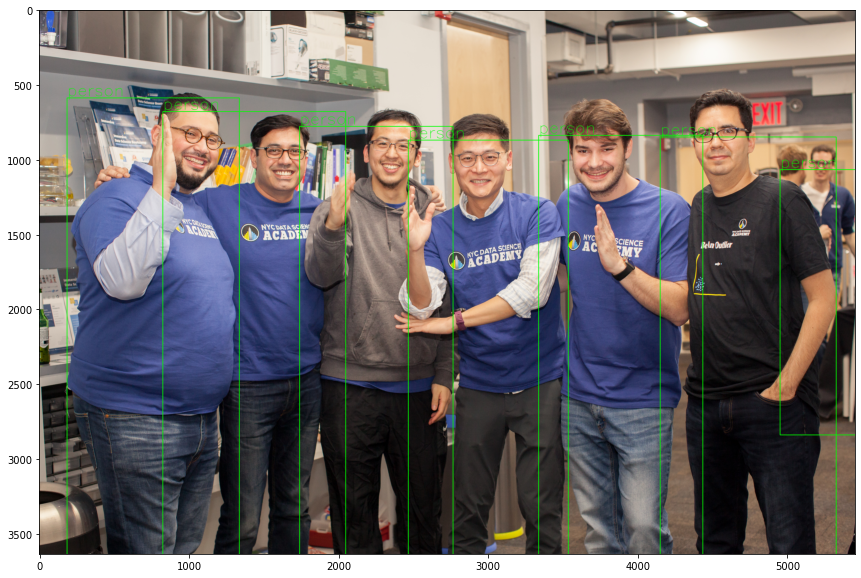

In [0]:
# OpenCV uses BGR rather than RGB so we have to change the order of dimension first
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,10))
plt.imshow(predicted_image)